<a href="https://colab.research.google.com/github/laboratoriodecodigos/Colab-Python/blob/main/Yolo_%2B_Bytetrack_en_Video.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q ultralytics supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 280.2/280.2 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.3 MB/s eta 0:00:00


In [17]:
from google.colab import files

uploaded = files.upload()
video_path = list(uploaded.keys())[0]

print("Video cargado:", video_path)

Saving caminando2.mp4 to caminando2 (1).mp4
Video cargado: caminando2 (1).mp4


In [3]:
import cv2
import numpy as np
import supervision as sv

from ultralytics import YOLO
from IPython.display import Video, display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
model = YOLO("yolov8n.pt")

Versión 1: detección simple

In [21]:
def detectar_sin_tracking(video_path, output_path):

    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    out = cv2.VideoWriter(
        output_path,
        fourcc,
        fps,
        (width, height)
    )

    while True:

        ret, frame = cap.read()

        if not ret:
            break
        # Detección con YOLO
        results = model(frame, verbose=False)[0]
        # Convertir detecciones a supervision
        detections = sv.Detections.from_ultralytics(results)
        # Solo personas
        detections = detections[
            detections.class_id == 0
        ]
        # Dibujar únicamente bounding boxes
        box_annotator = sv.BoxAnnotator()
        frame = box_annotator.annotate(
            scene=frame,
            detections=detections
        )
        # Texto explicativo
        cv2.putText(
            frame,
            "YOLO: DETECTANDO FRAME A FRAME",
            (30, 50),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (255, 0, 255),
            2
        )

        cv2.putText(
            frame,
            "Sin memoria de identidad",
            (30, 90),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (255, 0, 255),
            2
        )
        out.write(frame)
    cap.release()
    out.release()


detectar_sin_tracking(
    video_path,
    "deteccion_simple.mp4"
)

In [12]:
display(Video("deteccion_simple.mp4", embed=True))

In [22]:
from google.colab import files

files.download("deteccion_simple.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Versión 2: YOLO + ByteTrack

In [23]:
def detectar_con_bytetrack(video_path, output_path):

    cap = cv2.VideoCapture(video_path)

    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")

    out = cv2.VideoWriter(
        output_path,
        fourcc,
        fps,
        (width, height)
    )

    # Tracker
    tracker = sv.ByteTrack()

    # Anotadores
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator(
    text_scale=0.5,
    text_thickness=1
      )

    while True:

        ret, frame = cap.read()

        if not ret:
            break

        # YOLO detecta
        results = model(frame, verbose=False)[0]

        detections = sv.Detections.from_ultralytics(results)

        # Filtrar personas
        detections = detections[
            detections.class_id == 0
        ]

        # ByteTrack asigna IDs
        detections = tracker.update_with_detections(
            detections
        )

        # Dibujar cajas
        frame = box_annotator.annotate(
            scene=frame,
            detections=detections
        )

        # Crear etiquetas
        labels = []

        for tracker_id in detections.tracker_id:

            labels.append(
                f"PERSONA ID {tracker_id}"
            )

        # Dibujar IDs
        frame = label_annotator.annotate(
            scene=frame,
            detections=detections,
            labels=labels
        )

        # Texto superior
        cv2.putText(
            frame,
            "YOLO + BYTETRACK",
            (30, 50),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),
            2
        )

        cv2.putText(
            frame,
            "Seguimiento de identidad",
            (30, 90),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            (0, 255, 0),
            2
        )

        out.write(frame)

    cap.release()
    out.release()


detectar_con_bytetrack(
    video_path,
    "yolo_bytetrack.mp4"
)

In [19]:
display(Video("yolo_bytetrack.mp4", embed=True))

In [25]:
from google.colab import files

files.download("yolo_bytetrack.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

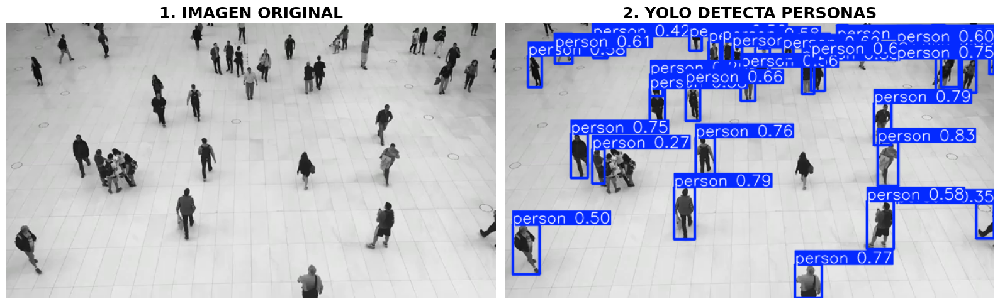

In [26]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Cargar modelo YOLO
model = YOLO("yolov8n.pt")

# Leer el video
cap = cv2.VideoCapture(video_path)

# Obtener un frame
ret, frame = cap.read()

cap.release()

# Convertir de BGR a RGB
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Ejecutar YOLO
results = model(
    frame,
    classes=[0],       # Solo personas
    imgsz=640,
    verbose=False
)

# Obtener imagen con detecciones
annotated_frame = results[0].plot()

# Convertir a RGB
annotated_frame = cv2.cvtColor(
    annotated_frame,
    cv2.COLOR_BGR2RGB
)

# Crear comparación
fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 7)
)

# Imagen original
axes[0].imshow(frame_rgb)
axes[0].set_title(
    "1. IMAGEN ORIGINAL",
    fontsize=18,
    fontweight="bold"
)
axes[0].axis("off")

# Imagen procesada por YOLO
axes[1].imshow(annotated_frame)
axes[1].set_title(
    "2. YOLO DETECTA PERSONAS",
    fontsize=18,
    fontweight="bold"
)
axes[1].axis("off")

plt.tight_layout()

# Guardar imagen
plt.savefig(
    "proceso_yolo.png",
    dpi=200,
    bbox_inches="tight"
)

plt.show()